In [43]:
from datetime import datetime
import os
import sys
import shutil

import cv2
import numpy as np
import pandas as pd
# import socketio
# import eventlet
# from matplotlib.image import imread
import matplotlib.image as mpimg
# import eventlet.wsgi
from PIL import Image

from flask import Flask
# from io import BytesIO

from keras.models import load_model
import h5py
from keras import __version__ as keras_version

from scipy.misc import imread

from keras.utils import np_utils

from random import *
from time import sleep
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


# sys.path.append(os.path.dirname(os.path.abspath(os.path.dirname(__file__))))
sys.path.insert(0, '/home/hclee/workspace/git_adev2/lane_localization')
import myconfig
import imagedefine
import classdefine


In [44]:
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

app = Flask(__name__)
model = None
prev_image_array = None

first = 0
second = 0
third = 0
fourth = 0

In [45]:
def telemetry(imgpath, i, name, top_crop=0.5, bottom_crop=0.1):

    try:
        image_output = mpimg.imread(imgpath)
    except FileNotFoundError:
        print ('FileNotFoundError : ', imgpath)
        return '', ''

    image_crop = imagedefine.crop(image_output, top_crop, bottom_crop)
    image_resize = imagedefine.resize(image_crop, new_dim=(myconfig.resize_image_height, myconfig.resize_image_width))
    laneidx = model.predict(image_resize[None, :, :, :], batch_size=1)
    result = round(np.argmax(laneidx))

    if myconfig.def_output_type == 2:
        return np.argmax(laneidx, axis=1), laneidx[0][np.argmax(laneidx, axis=1)], image_resize
    else:
        return np.around(laneidx)

In [46]:
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

app = Flask(__name__)
model = None
prev_image_array = None

first = 0
second = 0
third = 0
fourth = 0

In [47]:
modelpath = '/home/hclee/workspace/git_adev2/lane_localization/checkpoint/20190508-no-8-best/'
modelname = 'model-201905081608-77-loss:0.0165-val_loss:0.0411-val_acc:0.9860.hdf5'

model = load_model(modelpath+modelname)
data = pd.read_csv('/home/hclee/workspace/git_adev2/lane_localization/labels-20190509-cam.txt')
num_of_img = len(data)

# loopRange = 100
loopRange = num_of_img
total_predict_count = 0

# high_crop = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
# low_crop = [0.0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.45]
high_crop = [0.45]
low_crop = [0.25]

/home/virtualenv/hclee/lib/python3.5/site-packages/ipykernel_launcher.py:37: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.


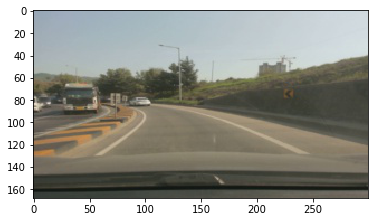

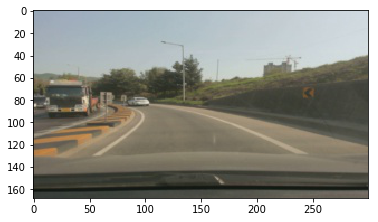

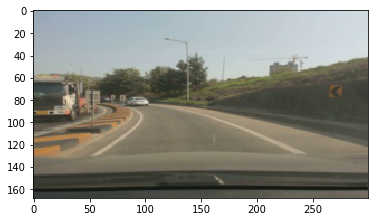

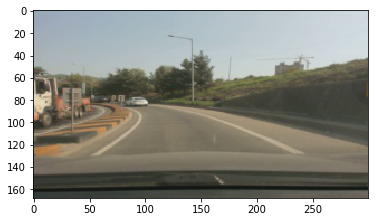

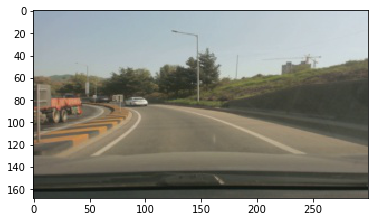

...

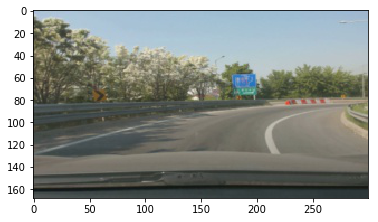

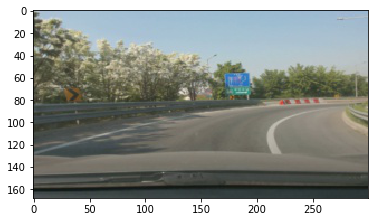

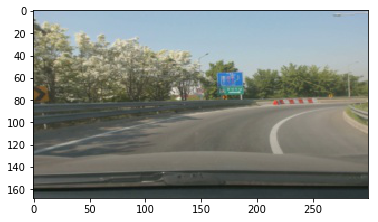

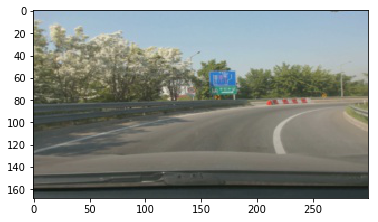

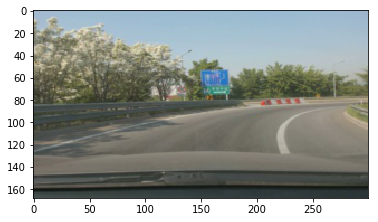

KeyboardInterrupt: 

In [56]:
# for h in range(len(high_crop)):
#     for l in range(len(low_crop)):
success = 0
fault = 0
sc = np.zeros(myconfig.num_classes)
fc = np.zeros(myconfig.num_classes)

recall_success = 0
recall_fault = 0
recall_sc = np.zeros(myconfig.num_classes)
recall_fc = np.zeros(myconfig.num_classes)

simply_success = 0
simply_fault = 0
simply_sc = np.zeros(myconfig.num_classes)
simply_fc = np.zeros(myconfig.num_classes)

starttime = datetime.now()

plt.figure()
for i in range(loopRange):
    img = data.iloc[i]['image'].strip()
    lable = classdefine.type_to_classnum(data.iloc[i]['lane'])

    if img.find("4mm-01") > 0:
        continue

    if img.find("12mm-01") > 0:
        continue

# #     total_predict_count += 1

    name = img[:-4]
    name = name.split('/')
    laneidx, recall, img_resize = telemetry(img, lable, name[-1], high_crop[0], low_crop[0])

    ori_img = imread(img)
    plt.imshow(ori_img);  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image
    plt.show()
#     sleep(1)
            
#             result = classdefine.classnum_to_type(laneidx)

#             # print("lane={}, label={}, predict={}".format(data.iloc[i]['lane'], lable, result))
#             if result[myconfig.class_type] == lable[myconfig.class_type]:
#                 success = success + 1
#                 sc[lable[myconfig.class_type]] = sc[lable[myconfig.class_type]] + 1
#             else:
#                 # print("lane={}, label={}, predict={}, img={}".format(data.iloc[i]['lane'], lable, result, name[-1]))
#                 fault = fault + 1
#                 fc[lable[myconfig.class_type]] = fc[lable[myconfig.class_type]] + 1

#             if recall > 0.9:
#                 if result[myconfig.class_type] == lable[myconfig.class_type]:
#                     recall_success += 1
#                     recall_sc[lable[myconfig.class_type]] +=1
#                 else:
#                     # print("lane={}, label={}, predict={}, img={}".format(data.iloc[i]['lane'], lable, result, name[-1]))
#                     recall_fault += 1
#                     recall_fc[lable[myconfig.class_type]] += 1

#                 result_simple = classdefine.type_to_simpleclass(result[1])
#                 if classdefine.type_to_simpleclass(lable[1]) == result_simple:
#                     simply_success += 1
#                     simply_sc[classdefine.type_to_simpleclass(lable[1])] +=1
#                 else:
#                     # print("lane={}, label={}, predict={}, img={}".format(data.iloc[i]['lane'], lable, result, name[-1]))
#                     simply_fault += 1
#                     simply_fc[classdefine.type_to_simpleclass(lable[1])] +=1

#             i += 1

#             plt.imshow(img_resize);  #call as plt.imshow(gray, cmap='gray') to show a grayscaled image
#             plt.axis('off');

# #             cv2.imshow('image', img_resize)
# #             sleep(0.001)  #display time

#         endtime = datetime.now()
#         # print("end time : ", endtime-starttime)
#         total_avg = round(success/total_predict_count, 2)
#         total_avg1 = round(recall_success/(recall_success+recall_fault), 2)
#         total_avg2 = round(simply_success/(simply_success+simply_fault), 2)
#         # print ("(recall)성공:{}, 실패:{}, 평균:{}, (precesion)성공:{}, 실패:{}, 평균:{}".format(success, fault, total_avg, recall_success, recall_fault, total_avg1))
#         print ("{}, {}, {}, {}, {}, {}, {}, {}, {}, {}, {}".format(high_crop[h], low_crop[l], success, fault, total_avg, recall_success, recall_fault, total_avg1, simply_success, simply_fault, total_avg2))

#         for i in range(myconfig.num_classes):
#             if sc[i] != 0:
#                 avg = round(sc[i] / (sc[i] + fc[i]), 2)
#                 avg1 = round(recall_sc[i] / (recall_sc[i] + recall_fc[i]), 2)
#             else:
#                 avg = 0.0
#                 avg1 = 0.0

#             if sc[i] != 0 or fc[i] != 0:
#                 print("{}, {}, {}, {}, {}, {}, {}".format(classdefine.midclassnum_to_type(i), sc[i], fc[i], avg, recall_sc[i], recall_fc[i], avg1))